In [202]:
%matplotlib inline
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import matplotlib.pyplot as plt
import torchvision.utils
import numpy as np
import random
from PIL import Image
import torch
from torch.autograd import Variable
import PIL.ImageOps    
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

In [203]:
def imshow(img,text=None,should_save=False):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()    

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [204]:
class SiameseNetworkDataset(Dataset):
    
    def __init__(self,imageFolderDataset,transform=None):
        self.imageFolderDataset = imageFolderDataset    
        self.transform = transform
        
    def __getitem__(self,index):
        class_names = folder_dataset.classes
        class_indices = folder_dataset.class_to_idx
        random_class = random.choice(class_names)
        # decide get the same class img
        get_same_class = random.randint(0,1) 
        
        sample_indices = []
        for index, label in enumerate(folder_dataset.targets):
            if get_same_class and label == class_indices[random_class]:
                sample_indices.append(index)
            elif not get_same_class and label != class_indices[random_class]:
                sample_indices.append(index)
        
        random_indices = random.sample(sample_indices, 2)
        
        img_1, label_1 = folder_dataset[random_indices[0]]
        img_2, label_2 = folder_dataset[random_indices[1]]

        if self.transform:
            img_1 = self.transform(img_1)
            img_2 = self.transform(img_2)
        
        # 1 means the pairs are same, 0 means diff
        return img_1, img_2 , torch.from_numpy(np.array([int(label_1!=label_2)],dtype=np.float32))
    
    def __len__(self):
        return len(self.imageFolderDataset.imgs)

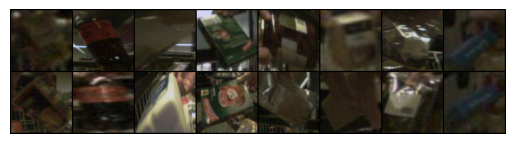

[[0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]]


In [205]:
data_root = "/home/walter/git/Siamese_object_recognition/data"
folder_dataset = dset.ImageFolder(root=data_root)
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset,
                                        transform=transforms.Compose([transforms.Resize((100,100)),
                                                                      transforms.ToTensor()]))

vis_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=8)

dataiter = iter(vis_dataloader)
dataiter
example_batch = next(dataiter)
concatenated = torch.cat((example_batch[0],example_batch[1]),0)
imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy())

In [206]:
from torchvision import models

class SiameseNetwork(nn.Module):
    def __init__(self, backbone="resnet18"):
        super(SiameseNetwork, self).__init__()
        
        if backbone not in models.__dict__:
            raise Exception("No model named {} exists in torchvision.models.".format(backbone))
            
        # Create a backbone network from the pretrained models provided in torchvision.models 
        self.backbone = models.__dict__[backbone](pretrained=True, progress=True)
        
        self.cls_head = nn.Sequential(
            nn.Linear(1000, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),

            nn.Dropout(p=0.5),
            nn.Linear(512, 64)
        )

    def forward_once(self, x):
        output = self.backbone(x)
        output = output.view(output.size()[0], -1)
        output = self.cls_head(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [207]:
class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


        return loss_contrastive

In [208]:
train_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=8)

In [209]:
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(),lr = 0.0005 )

/home/walter/miniconda3/envs/siamese/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/walter/miniconda3/envs/siamese/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [210]:
counter = []
loss_history = [] 
iteration_number= 0

Epoch number 0
 Current loss 18.262531280517578

Epoch number 0
 Current loss 7.889213562011719

Epoch number 0
 Current loss 16.97328758239746

Epoch number 0
 Current loss 4.727177619934082

Epoch number 0
 Current loss 2.5795674324035645

Epoch number 0
 Current loss 14.965354919433594

Epoch number 0
 Current loss 17.563352584838867

Epoch number 0
 Current loss 0.7967522144317627

Epoch number 0
 Current loss 12.08299446105957

Epoch number 0
 Current loss 5.357146739959717

Epoch number 0
 Current loss 7.073834419250488

Epoch number 0
 Current loss 5.604971885681152

Epoch number 0
 Current loss 4.358803749084473

Epoch number 0
 Current loss 8.296696662902832

Epoch number 0
 Current loss 3.187100410461426

Epoch number 0
 Current loss 6.9157328605651855

Epoch number 0
 Current loss 11.365755081176758

Epoch number 0
 Current loss 10.673809051513672

Epoch number 0
 Current loss 9.791694641113281

Epoch number 0
 Current loss 5.360246658325195

Epoch number 0
 Current loss 2.1

Epoch number 5
 Current loss 0.8957764506340027

Epoch number 5
 Current loss 0.8674324750900269

Epoch number 5
 Current loss 1.023384928703308

Epoch number 5
 Current loss 0.9054985046386719

Epoch number 5
 Current loss 1.0708951950073242

Epoch number 5
 Current loss 1.1491162776947021

Epoch number 5
 Current loss 1.0649590492248535

Epoch number 5
 Current loss 1.2398884296417236

Epoch number 5
 Current loss 1.0278010368347168

Epoch number 5
 Current loss 1.0280081033706665

Epoch number 5
 Current loss 0.9439934492111206

Epoch number 5
 Current loss 0.9994044899940491

Epoch number 5
 Current loss 0.9448792338371277

Epoch number 5
 Current loss 0.9794703722000122

Epoch number 5
 Current loss 0.946038007736206

Epoch number 5
 Current loss 1.002282977104187

Epoch number 5
 Current loss 1.1453988552093506

Epoch number 6
 Current loss 1.0392327308654785

Epoch number 6
 Current loss 0.8691660761833191

Epoch number 6
 Current loss 1.015580177307129

Epoch number 6
 Current 

Epoch number 10
 Current loss 0.9782367944717407

Epoch number 10
 Current loss 1.0965847969055176

Epoch number 10
 Current loss 0.8796155452728271

Epoch number 10
 Current loss 0.9612624645233154

Epoch number 11
 Current loss 1.0841262340545654

Epoch number 11
 Current loss 1.1805803775787354

Epoch number 11
 Current loss 0.8640633821487427

Epoch number 11
 Current loss 1.1501750946044922

Epoch number 11
 Current loss 0.8157487511634827

Epoch number 11
 Current loss 1.2170363664627075

Epoch number 11
 Current loss 0.7981672883033752

Epoch number 11
 Current loss 1.2027857303619385

Epoch number 11
 Current loss 1.1882660388946533

Epoch number 11
 Current loss 1.1752746105194092

Epoch number 11
 Current loss 1.0974671840667725

Epoch number 11
 Current loss 1.3108514547348022

Epoch number 11
 Current loss 1.3687082529067993

Epoch number 11
 Current loss 0.9962835311889648

Epoch number 11
 Current loss 1.2128031253814697

Epoch number 11
 Current loss 0.7984028458595276



Epoch number 16
 Current loss 1.3899437189102173

Epoch number 16
 Current loss 1.0789015293121338

Epoch number 16
 Current loss 0.8046741485595703

Epoch number 16
 Current loss 1.1539673805236816

Epoch number 16
 Current loss 1.2648661136627197

Epoch number 16
 Current loss 1.3029897212982178

Epoch number 16
 Current loss 1.2014693021774292

Epoch number 16
 Current loss 1.2143300771713257

Epoch number 16
 Current loss 0.8372676372528076

Epoch number 16
 Current loss 1.6655328273773193

Epoch number 16
 Current loss 0.6348978281021118

Epoch number 16
 Current loss 1.2012529373168945

Epoch number 16
 Current loss 1.039873480796814

Epoch number 16
 Current loss 0.6026732325553894

Epoch number 16
 Current loss 0.9820120334625244

Epoch number 16
 Current loss 1.1094963550567627

Epoch number 16
 Current loss 1.509169101715088

Epoch number 16
 Current loss 1.0810331106185913

Epoch number 16
 Current loss 1.0205707550048828

Epoch number 16
 Current loss 1.5176461935043335

Ep

Epoch number 21
 Current loss 1.0857270956039429

Epoch number 21
 Current loss 0.730133056640625

Epoch number 21
 Current loss 0.9793396592140198

Epoch number 21
 Current loss 0.9035316705703735

Epoch number 21
 Current loss 0.9512818455696106

Epoch number 21
 Current loss 1.3291187286376953

Epoch number 21
 Current loss 1.0492271184921265

Epoch number 21
 Current loss 0.846796452999115

Epoch number 21
 Current loss 1.0519078969955444

Epoch number 21
 Current loss 0.9322032928466797

Epoch number 21
 Current loss 1.213592767715454

Epoch number 21
 Current loss 1.0841724872589111

Epoch number 21
 Current loss 1.0127041339874268

Epoch number 21
 Current loss 1.0362482070922852

Epoch number 21
 Current loss 1.1037129163742065

Epoch number 22
 Current loss 0.9221628904342651

Epoch number 22
 Current loss 0.8768209218978882

Epoch number 22
 Current loss 1.020932674407959

Epoch number 22
 Current loss 0.7399777770042419

Epoch number 22
 Current loss 1.0800285339355469

Epoc

Epoch number 26
 Current loss 1.4634108543395996

Epoch number 26
 Current loss 1.2729567289352417

Epoch number 26
 Current loss 0.9156873226165771

Epoch number 26
 Current loss 1.076059341430664

Epoch number 26
 Current loss 0.8789699673652649

Epoch number 27
 Current loss 1.3493578433990479

Epoch number 27
 Current loss 1.3901140689849854

Epoch number 27
 Current loss 0.6821730136871338

Epoch number 27
 Current loss 1.0483684539794922

Epoch number 27
 Current loss 0.8775310516357422

Epoch number 27
 Current loss 1.2062731981277466

Epoch number 27
 Current loss 0.9943365454673767

Epoch number 27
 Current loss 0.8510611057281494

Epoch number 27
 Current loss 1.081475853919983

Epoch number 27
 Current loss 1.1566014289855957

Epoch number 27
 Current loss 1.009880542755127

Epoch number 27
 Current loss 1.1660730838775635

Epoch number 27
 Current loss 0.8758002519607544

Epoch number 27
 Current loss 1.1016041040420532

Epoch number 27
 Current loss 1.0866498947143555

Epo

Epoch number 32
 Current loss 0.8788623213768005

Epoch number 32
 Current loss 1.4623758792877197

Epoch number 32
 Current loss 1.1239802837371826

Epoch number 32
 Current loss 0.836426317691803

Epoch number 32
 Current loss 0.8304648995399475

Epoch number 32
 Current loss 1.0825703144073486

Epoch number 32
 Current loss 1.2928091287612915

Epoch number 32
 Current loss 0.8982876539230347

Epoch number 32
 Current loss 0.9235807657241821

Epoch number 32
 Current loss 0.9637999534606934

Epoch number 32
 Current loss 1.0385154485702515

Epoch number 32
 Current loss 1.2389678955078125

Epoch number 32
 Current loss 1.07512629032135

Epoch number 32
 Current loss 1.2317399978637695

Epoch number 32
 Current loss 0.9270168542861938

Epoch number 32
 Current loss 0.9790072441101074

Epoch number 32
 Current loss 0.8392395377159119

Epoch number 32
 Current loss 1.2033729553222656

Epoch number 32
 Current loss 0.9656041860580444

Epoch number 32
 Current loss 1.5362480878829956

Epo

Epoch number 37
 Current loss 0.7908391952514648

Epoch number 37
 Current loss 0.9862769246101379

Epoch number 37
 Current loss 0.8275185823440552

Epoch number 37
 Current loss 1.220598578453064

Epoch number 37
 Current loss 0.8956135511398315

Epoch number 37
 Current loss 0.868304967880249

Epoch number 37
 Current loss 1.0508394241333008

Epoch number 37
 Current loss 0.9547966718673706

Epoch number 37
 Current loss 0.7477083206176758

Epoch number 37
 Current loss 2.2453384399414062

Epoch number 37
 Current loss 1.001696228981018

Epoch number 37
 Current loss 0.7116481065750122

Epoch number 37
 Current loss 1.0328526496887207

Epoch number 37
 Current loss 0.8567042350769043

Epoch number 37
 Current loss 0.8109164834022522

Epoch number 37
 Current loss 1.0863628387451172

Epoch number 38
 Current loss 1.1692602634429932

Epoch number 38
 Current loss 0.9674727916717529

Epoch number 38
 Current loss 1.0804247856140137

Epoch number 38
 Current loss 1.0739905834197998

Epo

Epoch number 42
 Current loss 1.3764820098876953

Epoch number 42
 Current loss 0.7826307415962219

Epoch number 42
 Current loss 1.1393709182739258

Epoch number 42
 Current loss 0.9397404193878174

Epoch number 42
 Current loss 0.9410256743431091

Epoch number 42
 Current loss 0.9619436264038086

Epoch number 43
 Current loss 1.0384583473205566

Epoch number 43
 Current loss 1.0114554166793823

Epoch number 43
 Current loss 0.7922893762588501

Epoch number 43
 Current loss 1.6389726400375366

Epoch number 43
 Current loss 0.8475682735443115

Epoch number 43
 Current loss 1.1174551248550415

Epoch number 43
 Current loss 0.9648561477661133

Epoch number 43
 Current loss 1.0426231622695923

Epoch number 43
 Current loss 0.7863755226135254

Epoch number 43
 Current loss 1.1188130378723145

Epoch number 43
 Current loss 1.0950098037719727

Epoch number 43
 Current loss 1.1416456699371338

Epoch number 43
 Current loss 1.0745158195495605

Epoch number 43
 Current loss 0.8609365224838257



Epoch number 48
 Current loss 1.0813918113708496

Epoch number 48
 Current loss 1.1866846084594727

Epoch number 48
 Current loss 1.0392130613327026

Epoch number 48
 Current loss 0.7384299039840698

Epoch number 48
 Current loss 1.2493194341659546

Epoch number 48
 Current loss 0.8433114290237427

Epoch number 48
 Current loss 1.0609714984893799

Epoch number 48
 Current loss 1.1079201698303223

Epoch number 48
 Current loss 0.9946768283843994

Epoch number 48
 Current loss 1.2880911827087402

Epoch number 48
 Current loss 0.8071221113204956

Epoch number 48
 Current loss 1.0432443618774414

Epoch number 48
 Current loss 0.8593666553497314

Epoch number 48
 Current loss 0.9141297340393066

Epoch number 48
 Current loss 0.8316103219985962

Epoch number 48
 Current loss 1.2664283514022827

Epoch number 48
 Current loss 0.7321401238441467

Epoch number 48
 Current loss 0.8731629848480225

Epoch number 48
 Current loss 0.7367340326309204

Epoch number 48
 Current loss 0.9395997524261475



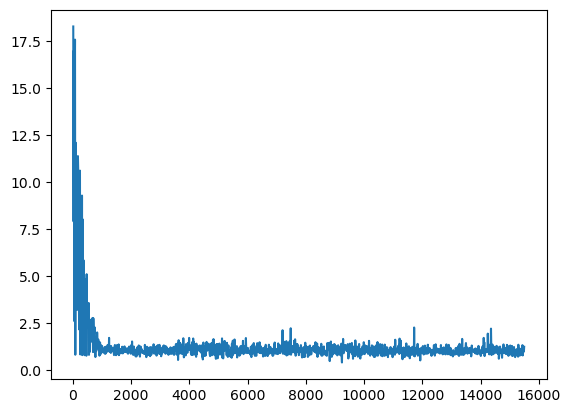

In [211]:
for epoch in range(0,50):
    for i, data in enumerate(train_dataloader,0):
        img0, img1 , label = data
        img0, img1 , label = img0.cuda(), img1.cuda() , label.cuda()
        optimizer.zero_grad()
        output1,output2 = net(img0,img1)
        loss_contrastive = criterion(output1,output2,label)
        loss_contrastive.backward()
        optimizer.step()
        if i %10 == 0 :
            print("Epoch number {}\n Current loss {}\n".format(epoch,loss_contrastive.item()))
            iteration_number +=10
            counter.append(iteration_number)
            loss_history.append(loss_contrastive.item())
show_plot(counter,loss_history)

In [212]:
from torch.autograd import Variable

img_path1 = "/home/walter/git/Siamese_object_recognition/data/0/0_100_00_0037.jpg"
img_path2 = "/home/walter/git/Siamese_object_recognition/data/1/1_102_00_0025.jpg"
img1 = Image.open(img_path1)
img2 = Image.open(img_path2)

transform = transforms.Compose([transforms.Resize((100,100)),
                                transforms.ToTensor()])
img1 = transform(img1)
img2 = transform(img2)
img1 = torch.unsqueeze(img1, dim=0)
img2 = torch.unsqueeze(img2, dim=0)
print(img1.shape)
net.to("cuda")
net.eval()
output1, output2 = net(img1.cuda(), img2.cuda())


# output1, output2 = net()

torch.Size([1, 3, 100, 100])


torch.Size([1, 64])


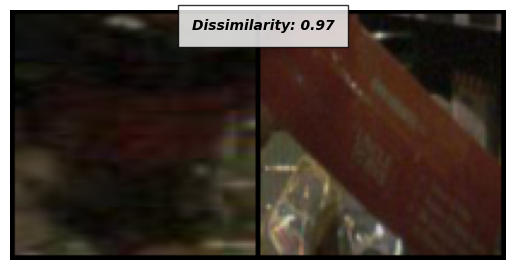

torch.Size([1, 64])


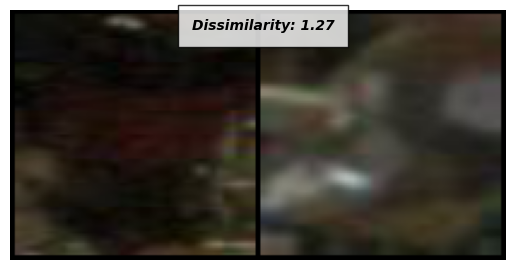

torch.Size([1, 64])


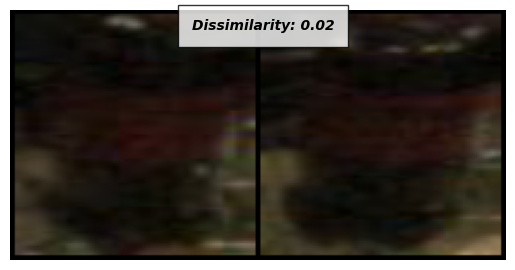

torch.Size([1, 64])


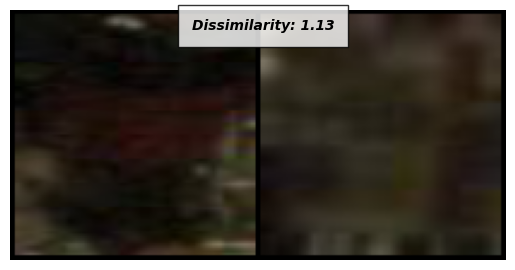

torch.Size([1, 64])


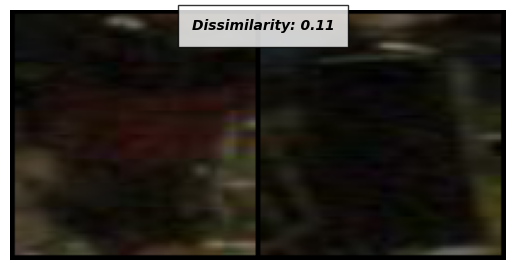

torch.Size([1, 64])


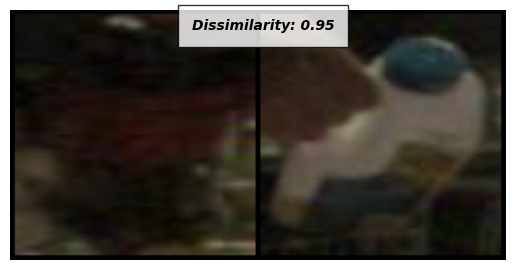

torch.Size([1, 64])


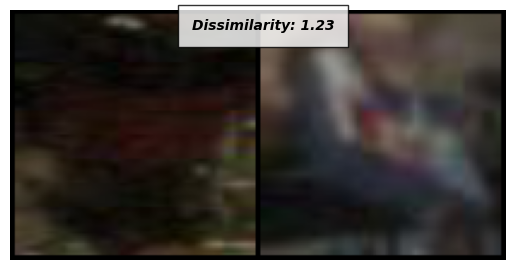

torch.Size([1, 64])


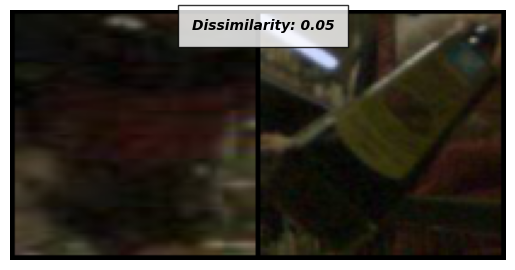

torch.Size([1, 64])


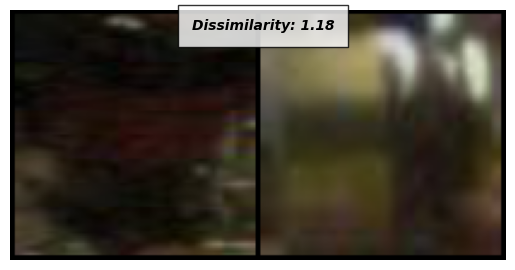

torch.Size([1, 64])


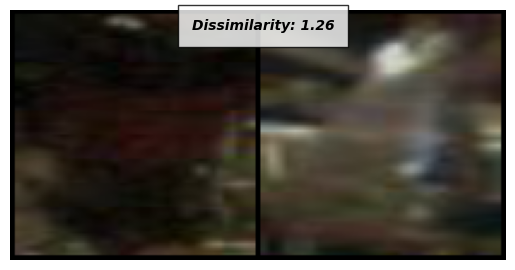

torch.Size([1, 64])


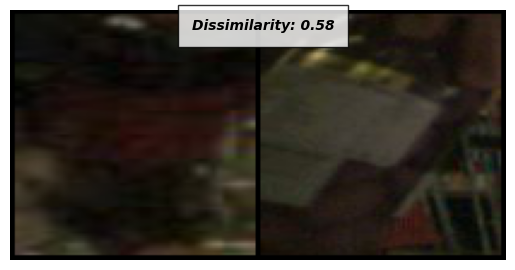

torch.Size([1, 64])


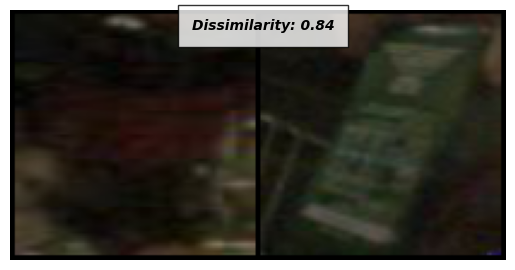

torch.Size([1, 64])


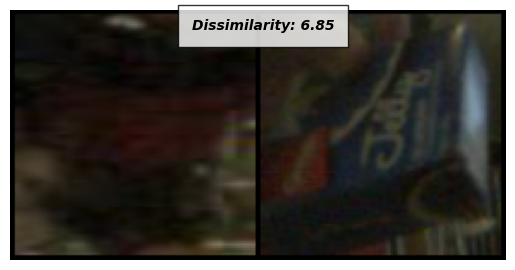

torch.Size([1, 64])


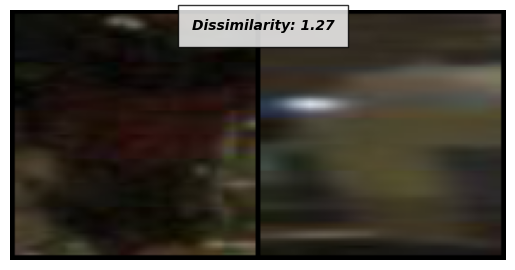

torch.Size([1, 64])


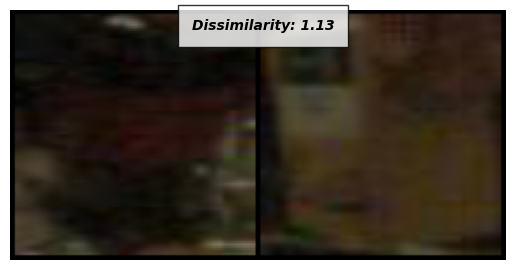

torch.Size([1, 64])


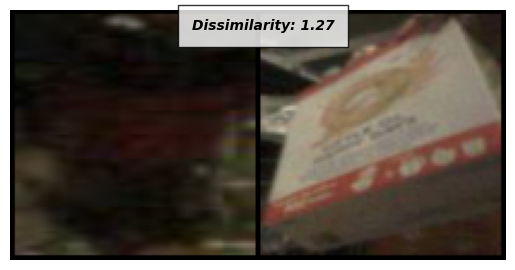

torch.Size([1, 64])


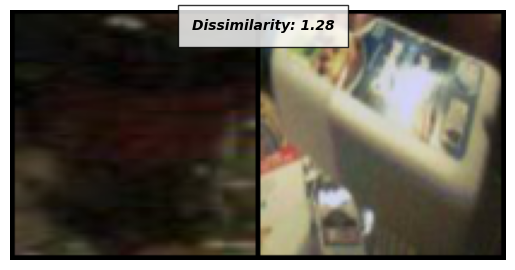

torch.Size([1, 64])


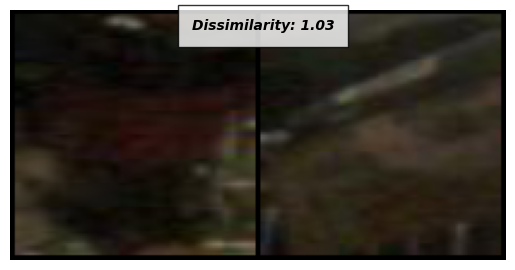

torch.Size([1, 64])


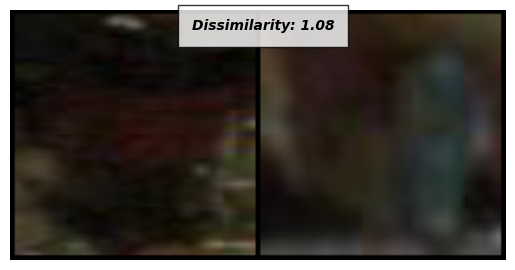

torch.Size([1, 64])


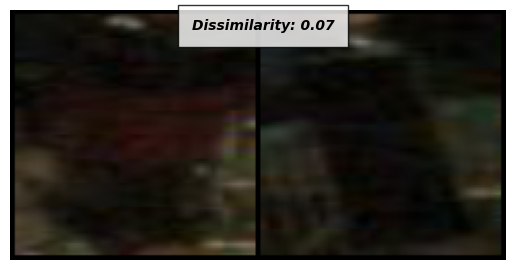

torch.Size([1, 64])


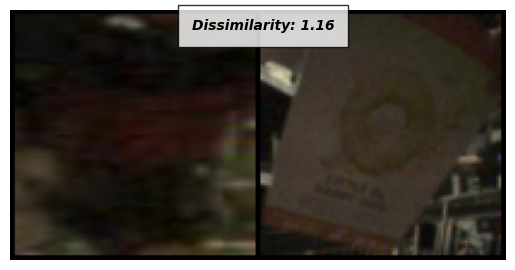

torch.Size([1, 64])


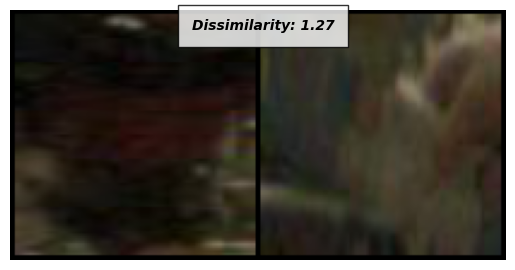

torch.Size([1, 64])


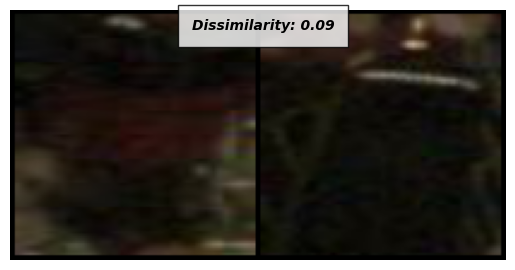

torch.Size([1, 64])


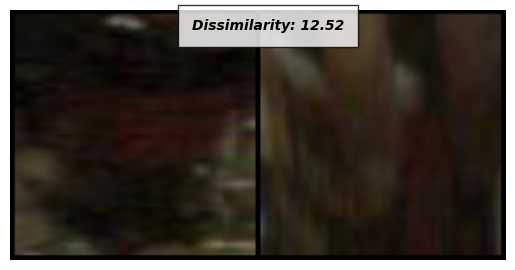

torch.Size([1, 64])


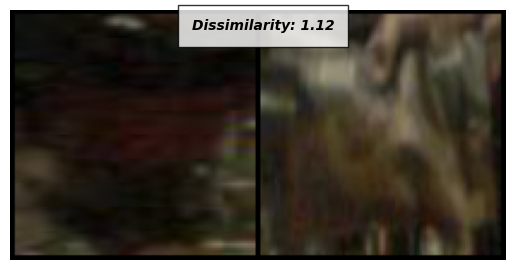

torch.Size([1, 64])


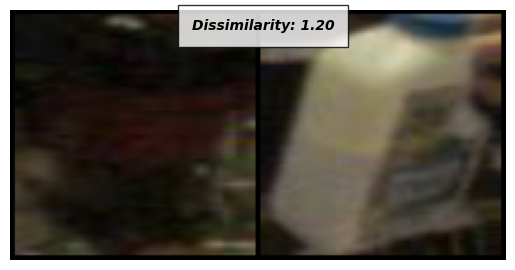

torch.Size([1, 64])


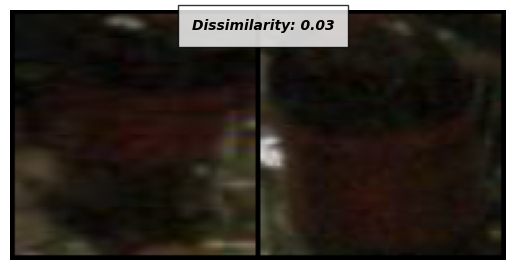

torch.Size([1, 64])


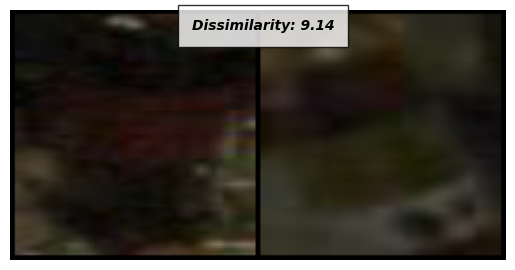

torch.Size([1, 64])


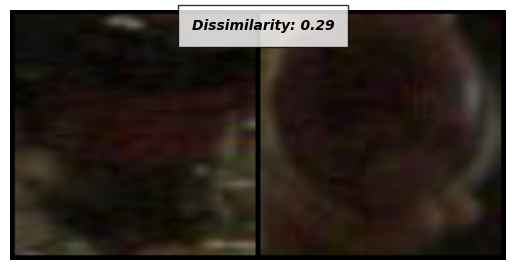

torch.Size([1, 64])


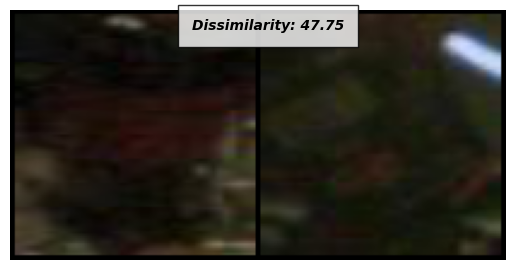

torch.Size([1, 64])


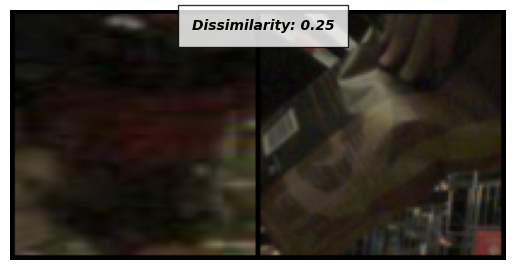

torch.Size([1, 64])


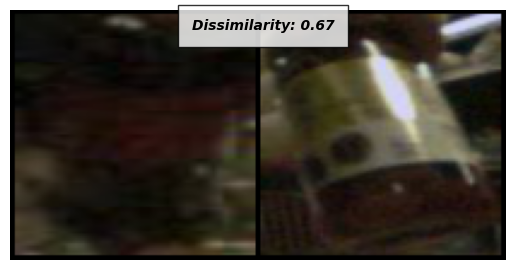

torch.Size([1, 64])


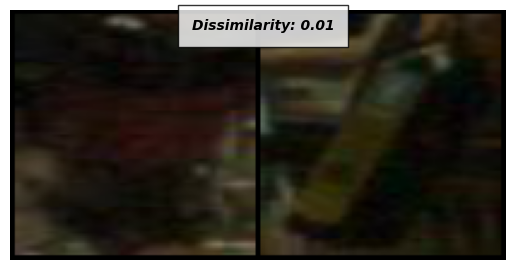

torch.Size([1, 64])


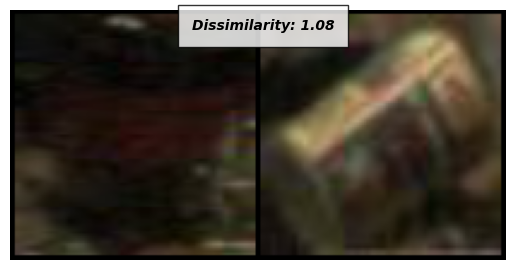

torch.Size([1, 64])


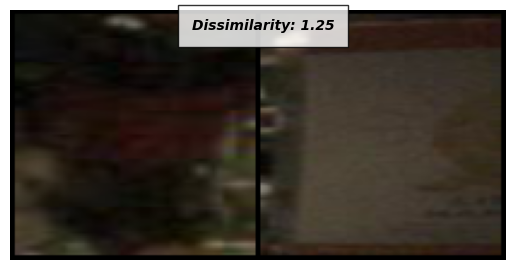

torch.Size([1, 64])


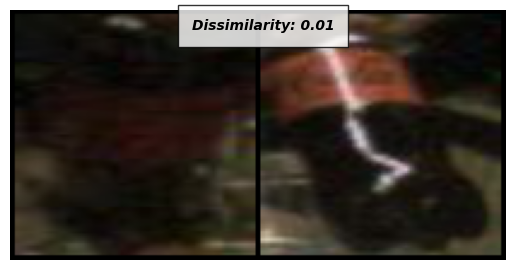

torch.Size([1, 64])


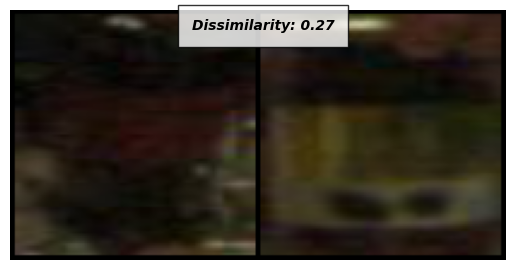

torch.Size([1, 64])


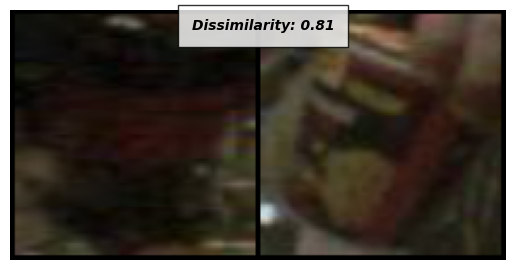

torch.Size([1, 64])


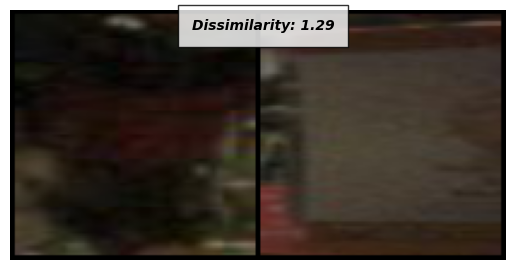

torch.Size([1, 64])


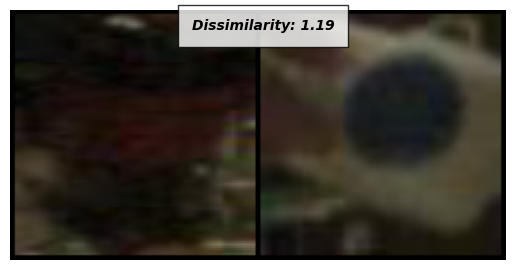

torch.Size([1, 64])


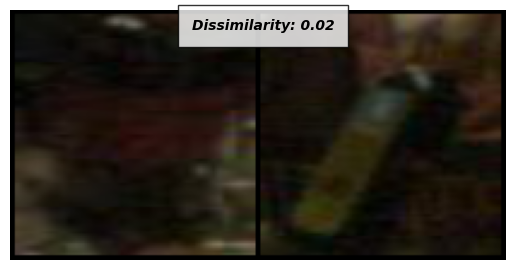

torch.Size([1, 64])


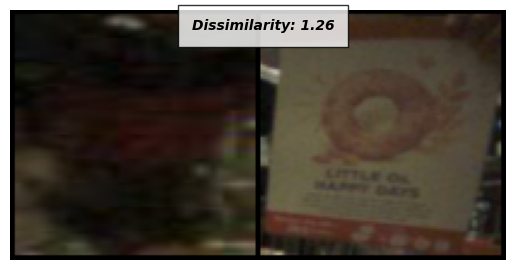

torch.Size([1, 64])


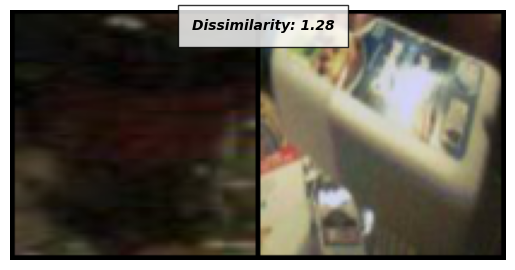

torch.Size([1, 64])


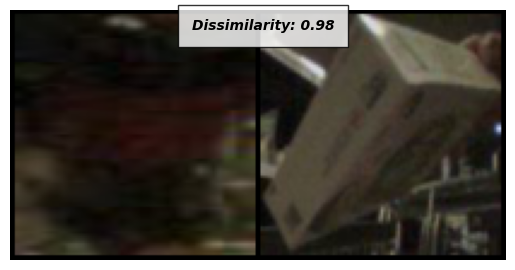

torch.Size([1, 64])


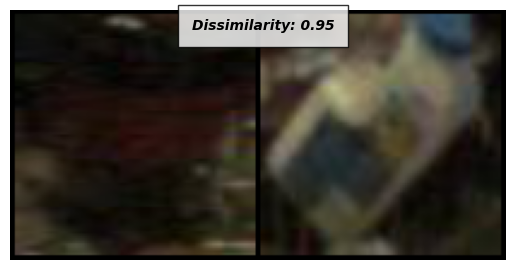

torch.Size([1, 64])


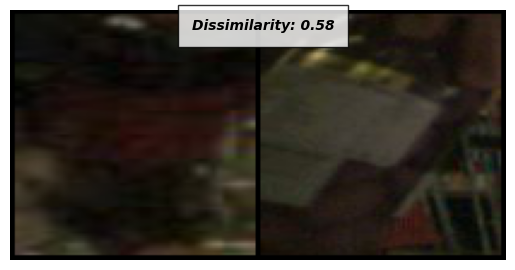

torch.Size([1, 64])


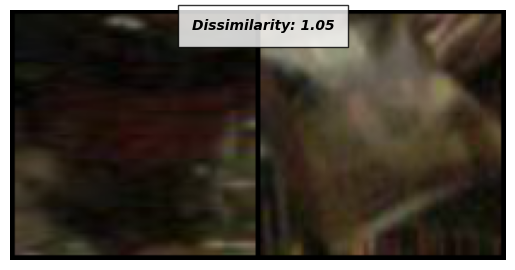

torch.Size([1, 64])


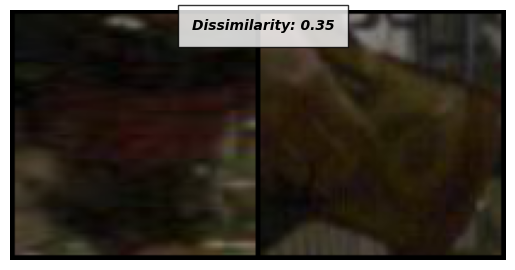

torch.Size([1, 64])


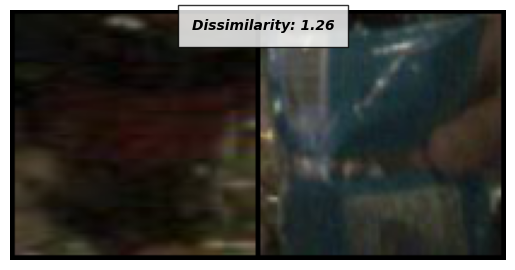

torch.Size([1, 64])


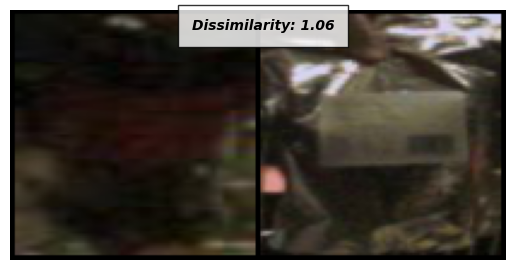

torch.Size([1, 64])


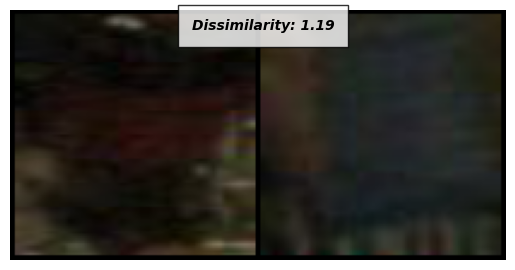

torch.Size([1, 64])


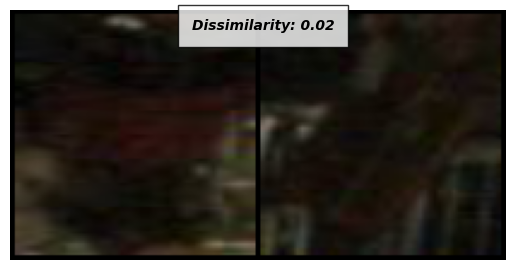

torch.Size([1, 64])


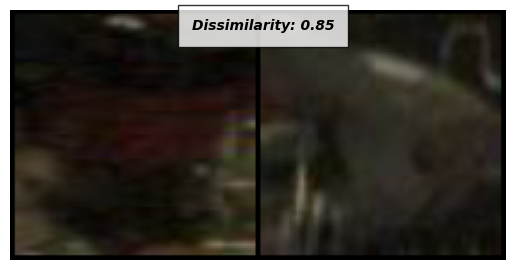

torch.Size([1, 64])


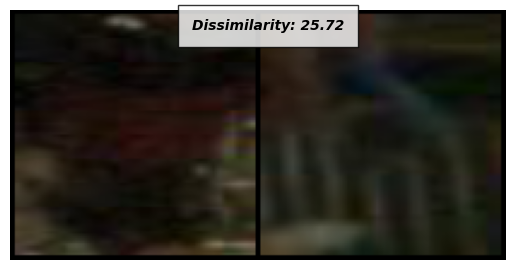

torch.Size([1, 64])


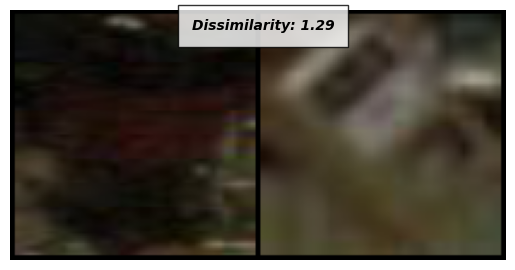

torch.Size([1, 64])


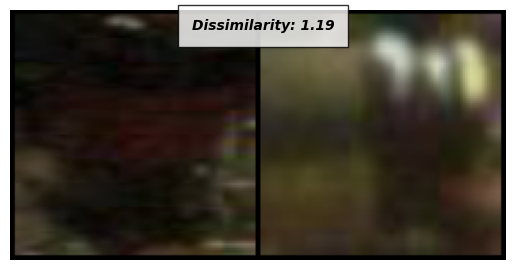

torch.Size([1, 64])


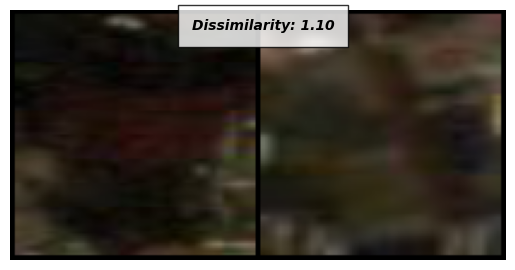

torch.Size([1, 64])


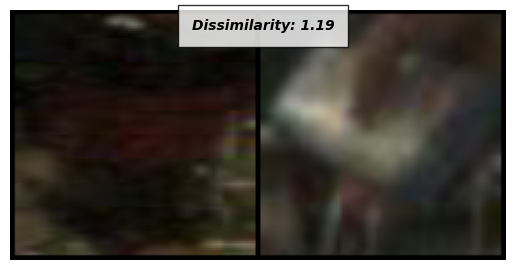

torch.Size([1, 64])


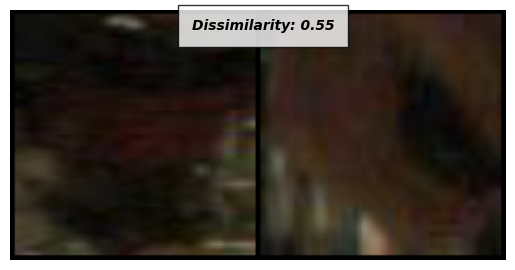

torch.Size([1, 64])


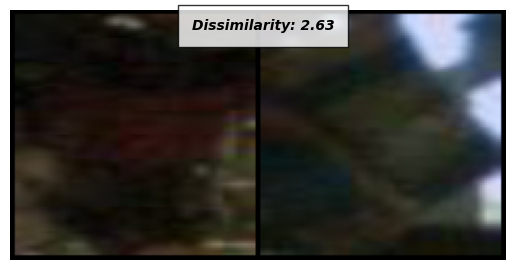

torch.Size([1, 64])


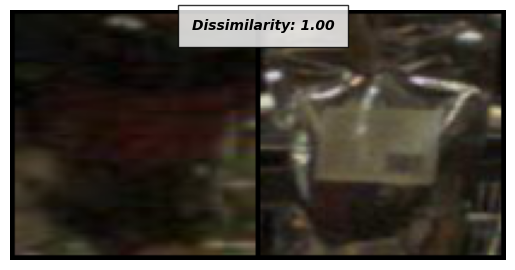

torch.Size([1, 64])


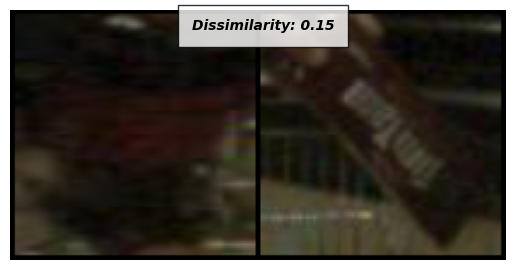

torch.Size([1, 64])


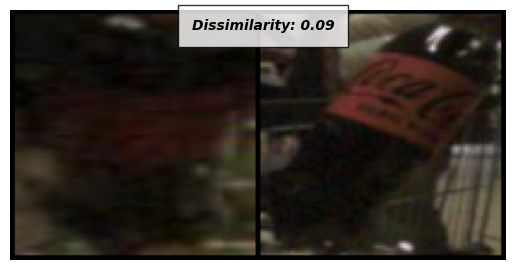

torch.Size([1, 64])


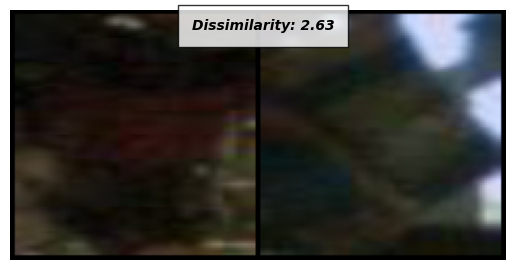

torch.Size([1, 64])


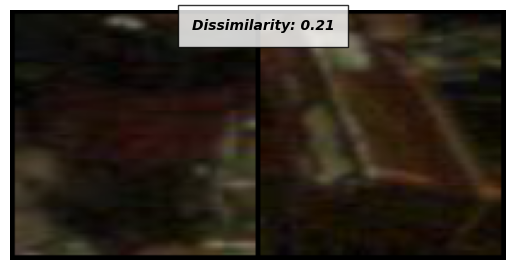

torch.Size([1, 64])


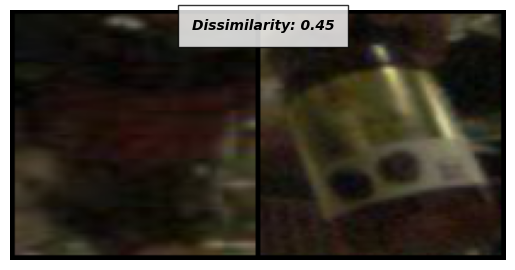

torch.Size([1, 64])


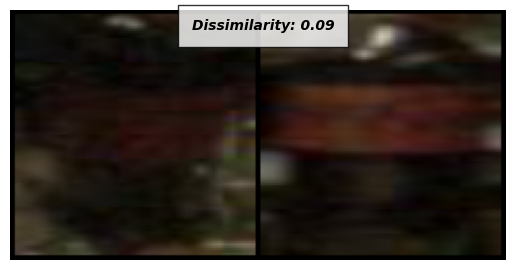

torch.Size([1, 64])


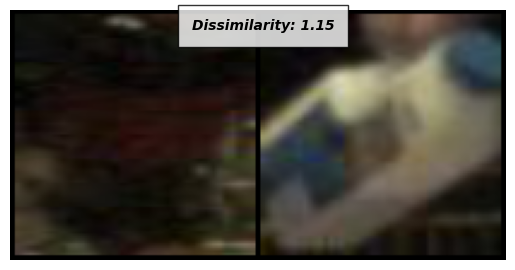

torch.Size([1, 64])


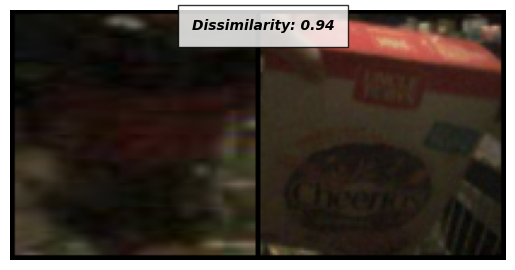

torch.Size([1, 64])


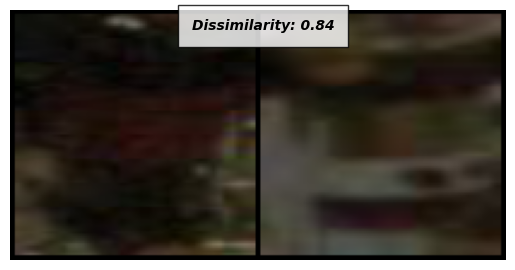

torch.Size([1, 64])


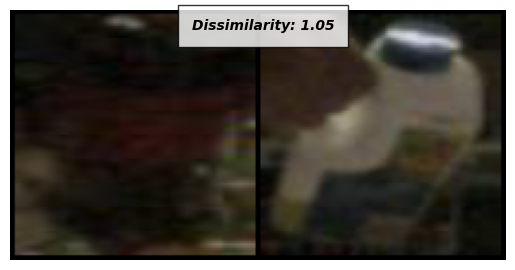

torch.Size([1, 64])


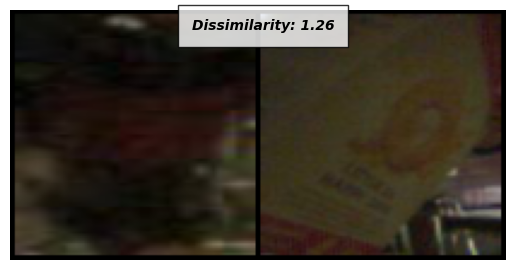

torch.Size([1, 64])


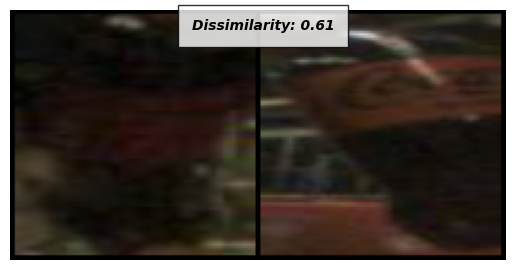

torch.Size([1, 64])


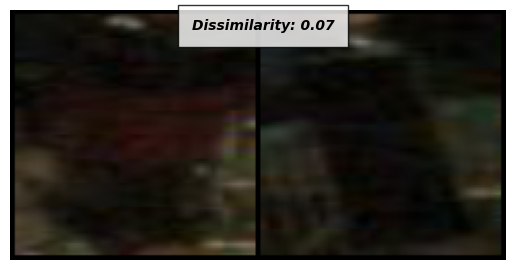

torch.Size([1, 64])


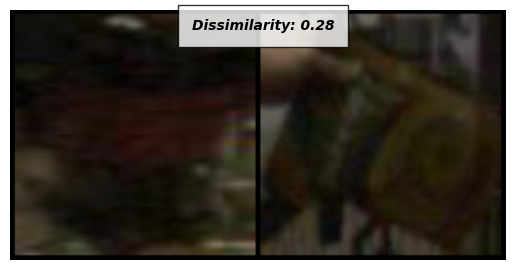

torch.Size([1, 64])


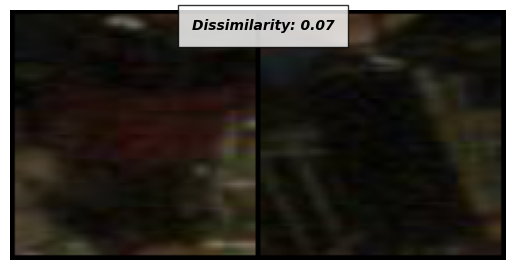

torch.Size([1, 64])


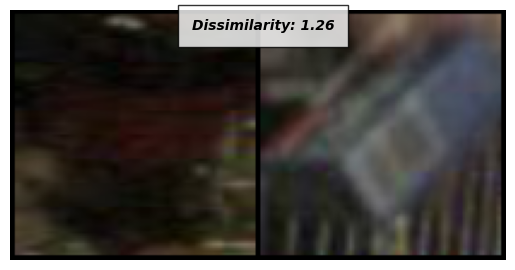

torch.Size([1, 64])


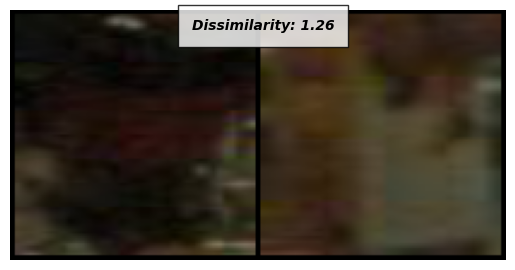

torch.Size([1, 64])


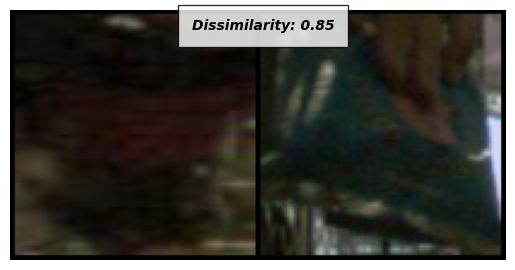

torch.Size([1, 64])


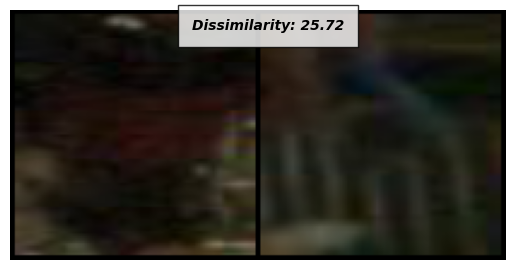

torch.Size([1, 64])


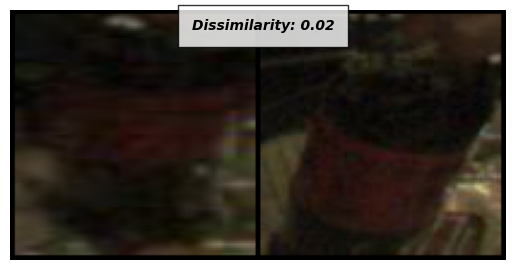

torch.Size([1, 64])


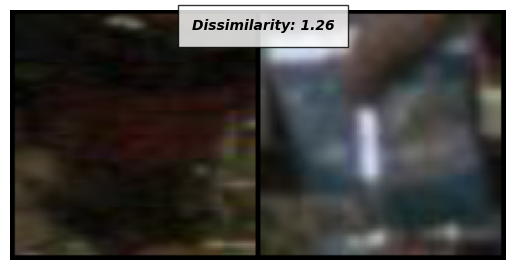

torch.Size([1, 64])


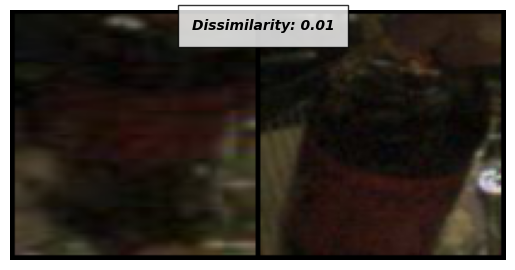

torch.Size([1, 64])


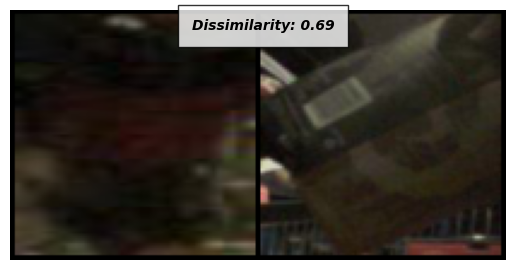

torch.Size([1, 64])


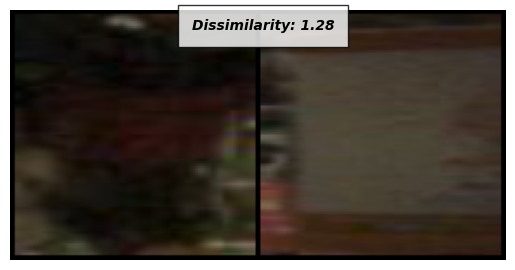

torch.Size([1, 64])


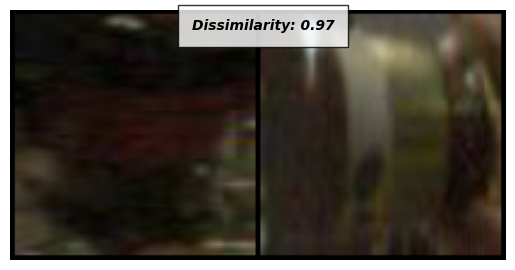

torch.Size([1, 64])


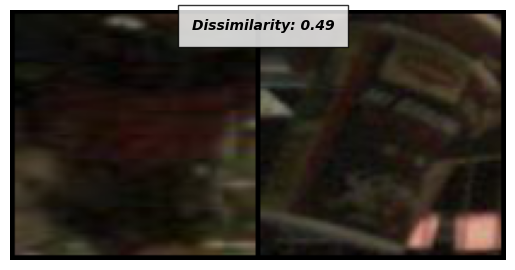

torch.Size([1, 64])


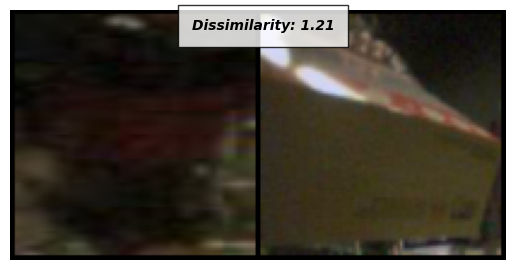

torch.Size([1, 64])


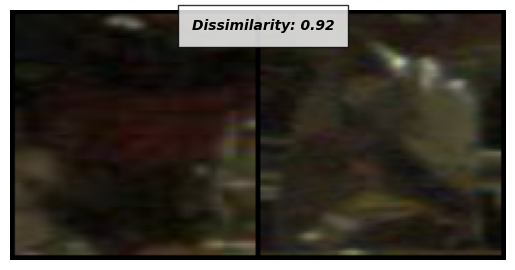

torch.Size([1, 64])


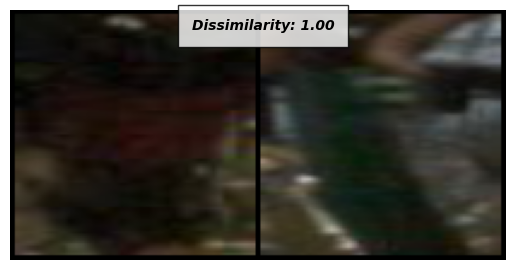

torch.Size([1, 64])


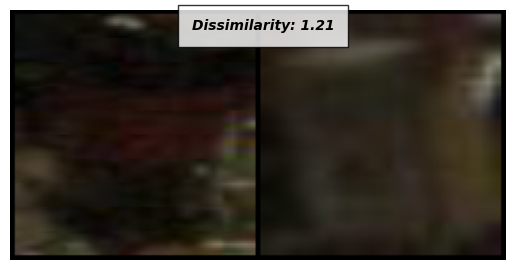

torch.Size([1, 64])


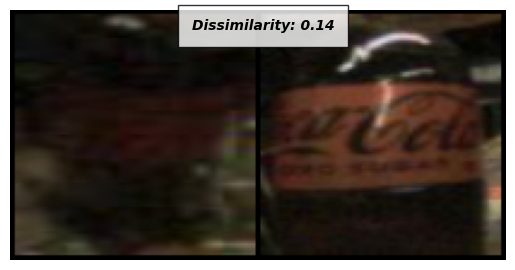

torch.Size([1, 64])


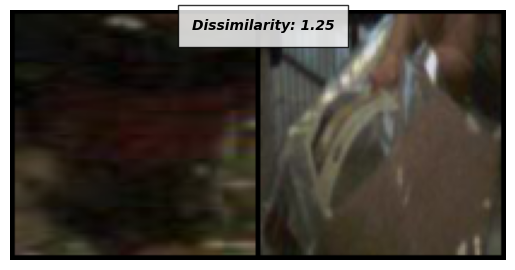

torch.Size([1, 64])


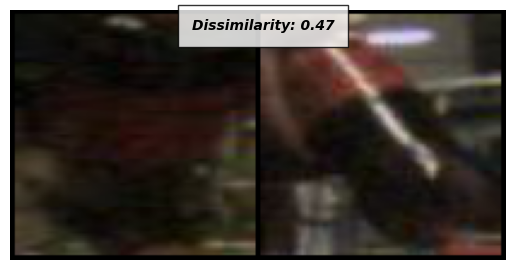

torch.Size([1, 64])


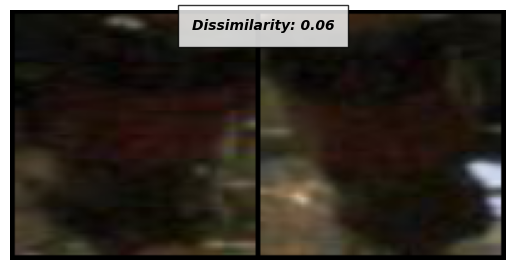

torch.Size([1, 64])


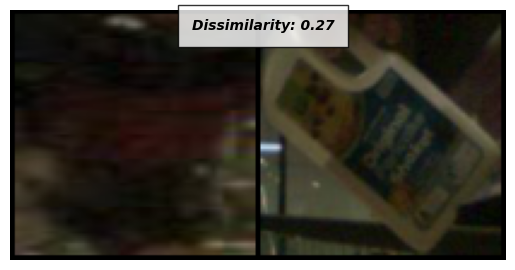

torch.Size([1, 64])


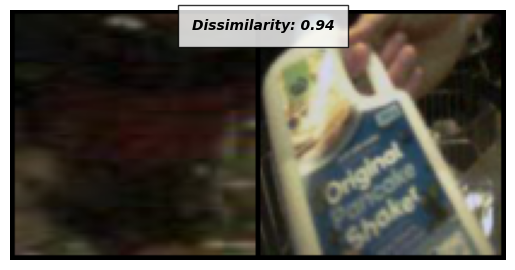

torch.Size([1, 64])


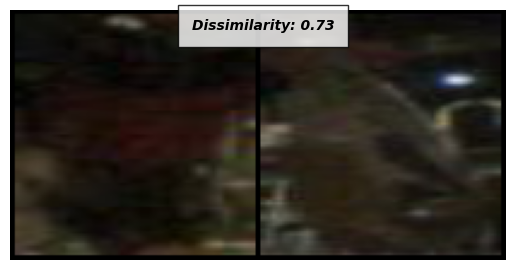

torch.Size([1, 64])


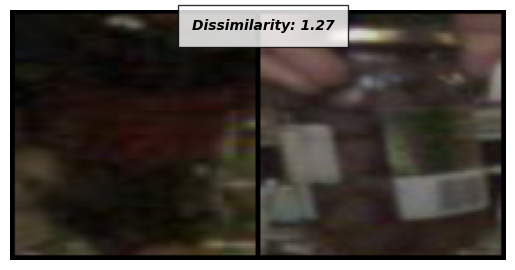

torch.Size([1, 64])


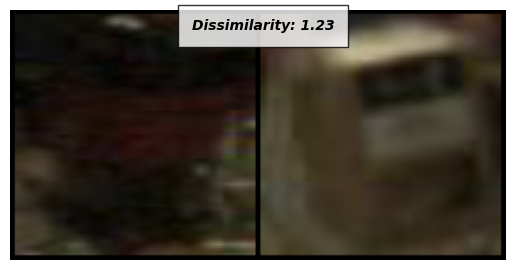

In [213]:
test_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=1)
dataiter = iter(test_dataloader)
net.eval()
x0,_,_ = next(dataiter)
for i in range(100):
    _,x1,label2 = next(dataiter)
    
    concatenated = torch.cat((x0,x1),0)
    output1,output2 = net(Variable(x0).cuda(),Variable(x1).cuda())
    print(output1.shape)
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated),'Dissimilarity: {:.2f}'.format(euclidean_distance.item()))